<a href="https://colab.research.google.com/github/TruongVanDuc19146177/AI/blob/main/nhandien_food.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
 #ket noi voi drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/AI_2

[Errno 2] No such file or directory: '/content/drive/MyDrive/AI_2'
/content


In [3]:
# Khai báo và sử dụng các thư viện sau
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import numpy as np
import tensorflow as tf
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import SGD, RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import validation 
from sklearn import preprocessing
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [4]:
# Tạo ra class ImageDataGenerator để chỉnh sửa ảnh 
train_datagen=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
# Tạo bộ dữ liệu training set
training_set=train_datagen.flow_from_directory('/content/drive/MyDrive/dataAI/food/Train',target_size=(150,150), batch_size=32, class_mode='categorical')
# Tạo bộ dữ liệu validation
validation=train_datagen.flow_from_directory('/content/drive/MyDrive/dataAI/food/Validate',target_size=(150,150), batch_size=32, class_mode='categorical')
# Các nhãn có trong bộ dữ liệu training set
validation.class_indices

Found 1788 images belonging to 10 classes.
Found 360 images belonging to 10 classes.


{'Banh beo': 0,
 'Banh chung': 1,
 'Banh mi': 2,
 'Banh tet': 3,
 'Banh trang nuong': 4,
 'Bun bo Hue': 5,
 'Bun dau mam tom': 6,
 'Com tam': 7,
 'Pho': 8,
 'Xoi xeo': 9}

In [7]:
# Tạo ra mạng CNN để train mô hình
model=Sequential()
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same',input_shape=(150,150,3))) 
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2)) 
model.add(Flatten())
model.add(Dense(128,activation='relu',kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
model.add(Dense(10,activation='softmax'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 150, 150, 32)      896       
                                                                 
 conv2d_7 (Conv2D)           (None, 150, 150, 32)      9248      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 conv2d_9 (Conv2D)           (None, 75, 75, 64)        36928     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 37, 37, 64)       0         
 2D)                                                  

In [8]:
# Biên dịch 
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
# Gán biến lại để vẽ đồ thị, với 500 lần học (epochs), mỗi lần học thì chỉ học␣128 dữ liệu (batch_size), khi sai số không thay đổi trong 20 lần học thì sẽ␣ dừng học 
history=model.fit(training_set,epochs=500,batch_size=128,verbose=1, validation_data=validation, callbacks=[EarlyStopping(monitor='val_loss', patience=20)])

Epoch 1/500
56/56 [==============================] - 588s 10s/step - loss: 2.5013 - accuracy: 0.1560 - val_loss: 2.2189 - val_accuracy: 0.2139
Epoch 2/500
56/56 [==============================] - 41s 739ms/step - loss: 2.0887 - accuracy: 0.2494 - val_loss: 2.0228 - val_accuracy: 0.2889
Epoch 3/500
56/56 [==============================] - 41s 737ms/step - loss: 1.9157 - accuracy: 0.3154 - val_loss: 2.0240 - val_accuracy: 0.2778
Epoch 4/500
56/56 [==============================] - 41s 739ms/step - loss: 1.8520 - accuracy: 0.3490 - val_loss: 1.9227 - val_accuracy: 0.3333
Epoch 5/500
56/56 [==============================] - 41s 734ms/step - loss: 1.7792 - accuracy: 0.3702 - val_loss: 1.7643 - val_accuracy: 0.3778
Epoch 6/500
56/56 [==============================] - 41s 732ms/step - loss: 1.6440 - accuracy: 0.4295 - val_loss: 1.7093 - val_accuracy: 0.3722
Epoch 7/500
56/56 [==============================] - 41s 727ms/step - loss: 1.5449 - accuracy: 0.4609 - val_loss: 1.5503 - val_accuracy: 

In [9]:
# Đánh giá độ chính xác của mô hình 
Score=model.evaluate(training_set,verbose=0)
print('Train Loss', Score[0])
print('Train Accuracy', Score[1])

Train Loss 0.11607897281646729
Train Accuracy 0.9731543660163879


<function matplotlib.pyplot.show>

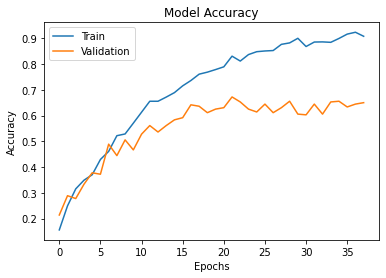

In [10]:
# Vẽ đồ thị giữa số lần học (Epochs) và độ chính xác (Accuracy)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Train','Validation'])
plt.show

In [14]:
# Lưu lại
from tensorflow.keras.models import load_model
model.save("Food.h5")

In [16]:
# Tải mô hình 
model_CNN=load_model('Food.h5')

Bánh tráng nướng


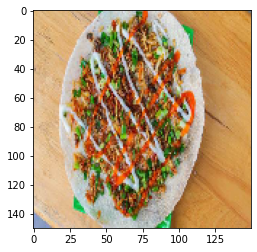

Bánh bèo


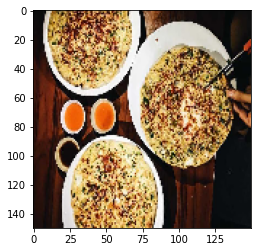

Bánh tráng nướng


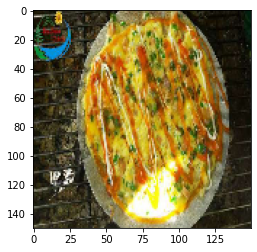

Bánh tráng nướng


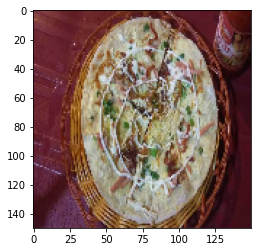

Bánh tráng nướng


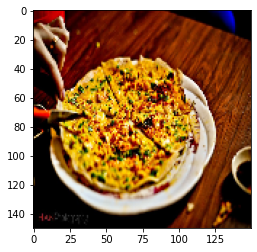

Bánh tráng nướng


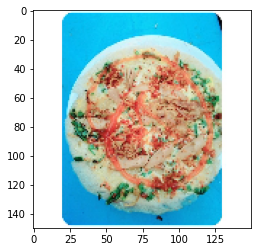

Bánh tráng nướng


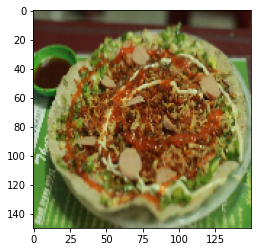

Bánh tráng nướng


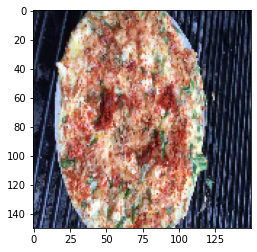

Bánh tráng nướng


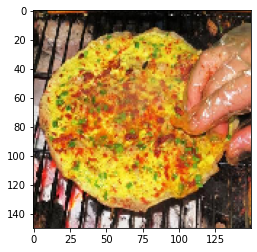

Cơm tấm


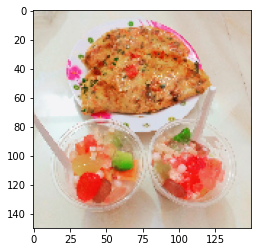

Cơm tấm


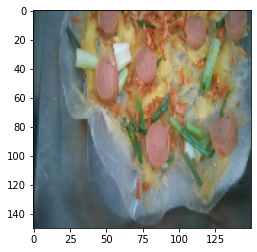

Bánh tráng nướng


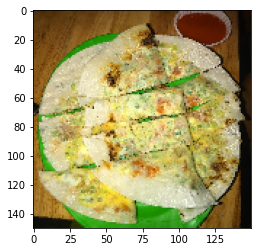

Bánh chưng


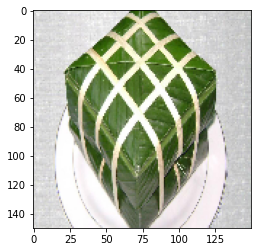

xôi


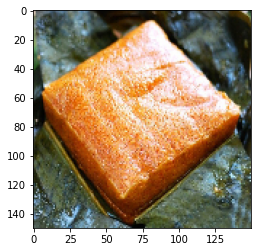

Bánh tét


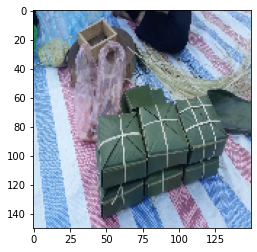

Bánh chưng


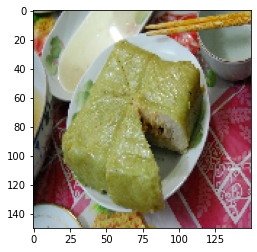

Bánh tét


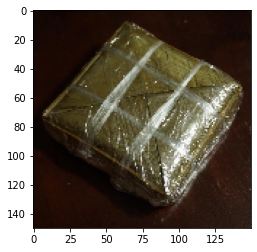

Bánh chưng


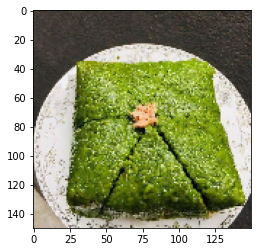

Bánh chưng


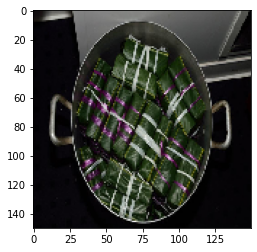

Bánh chưng


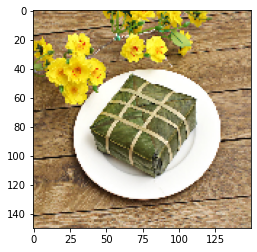

Phở


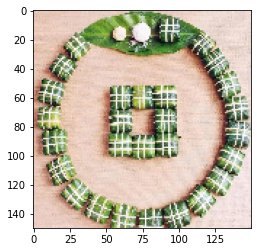

Bánh chưng


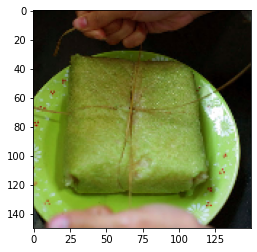

Bánh chưng


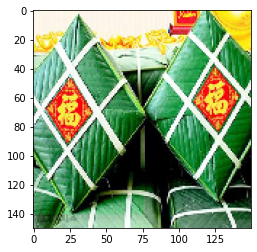

Bánh chưng


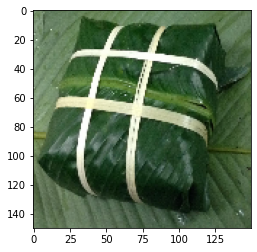

xôi


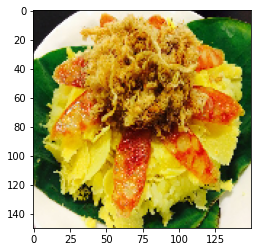

Bún bò Huế


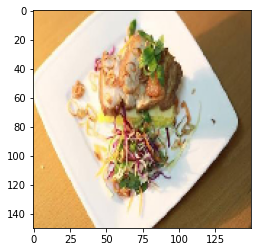

xôi


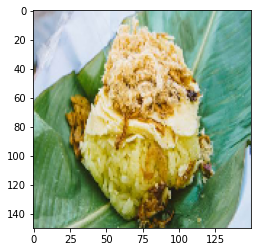

xôi


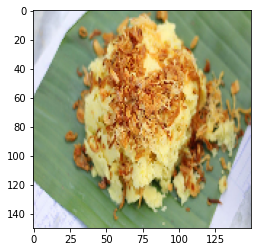

xôi


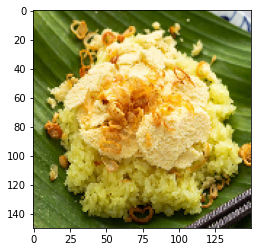

xôi


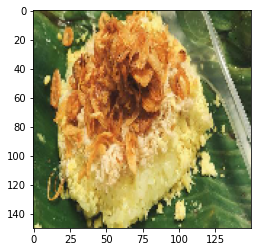

xôi


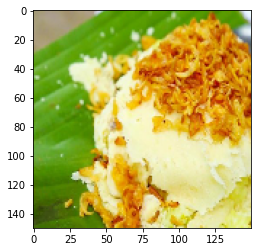

xôi


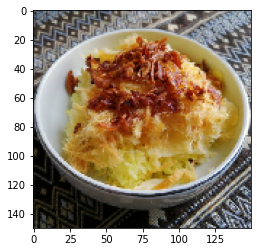

xôi


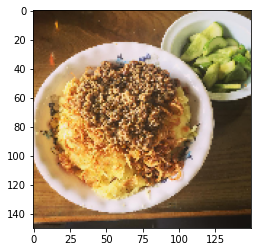

xôi


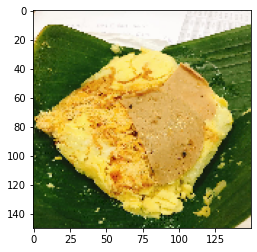

xôi


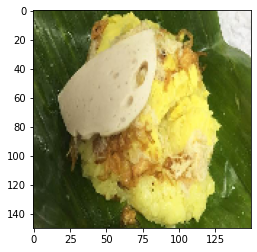

xôi


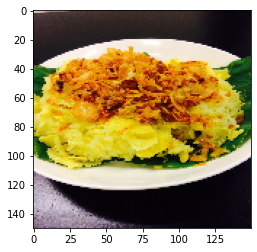

Phở


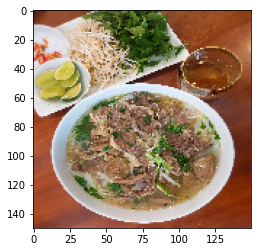

Bánh chưng


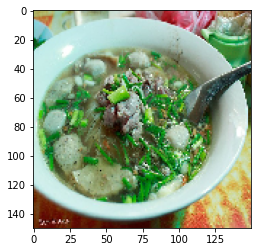

Phở


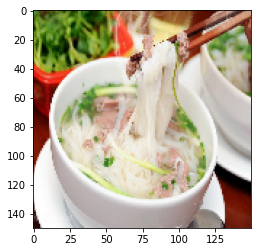

Phở


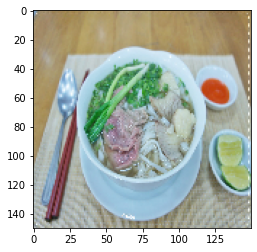

Phở


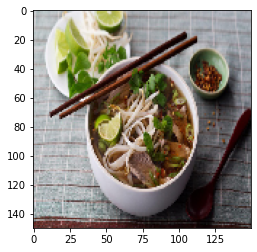

Phở


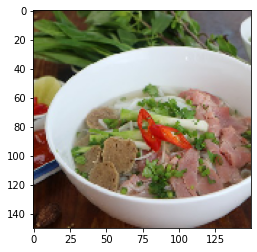

Phở


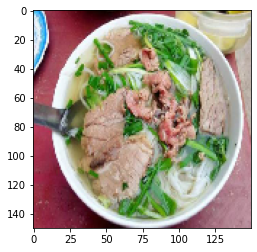

Phở


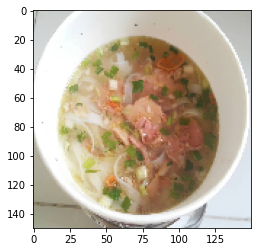

Phở


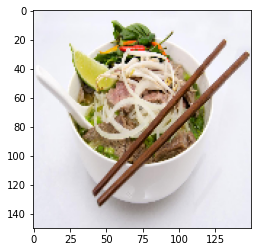

Phở


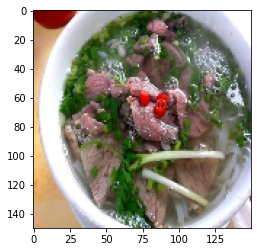

Bánh mì


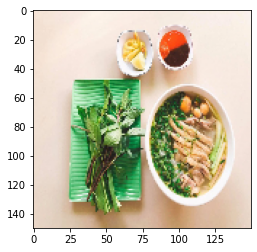

Phở


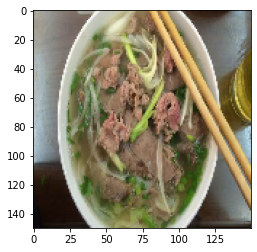

Bánh mì


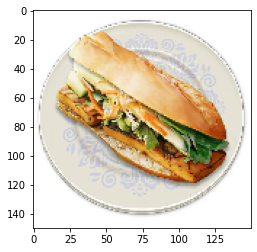

Bánh mì


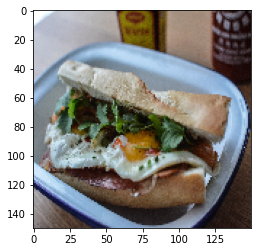

Bánh mì


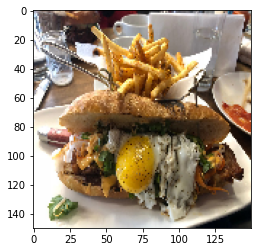

Bánh tráng nướng


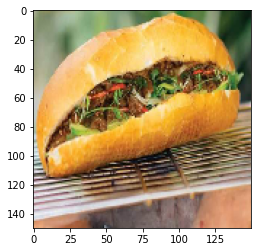

Bún đậu mắn tôm


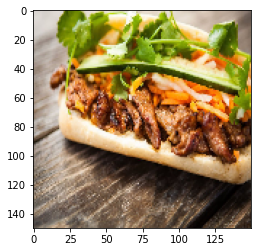

Bánh mì


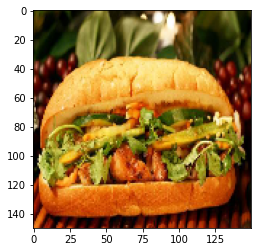

Bánh mì


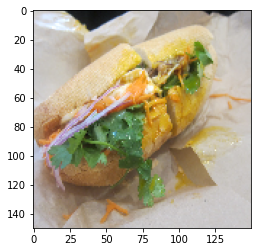

Bún bò Huế


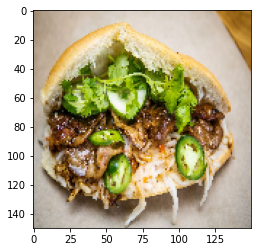

Bún đậu mắn tôm


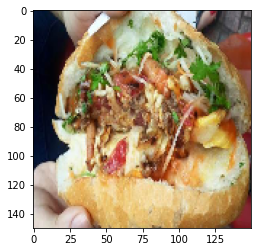

Bánh mì


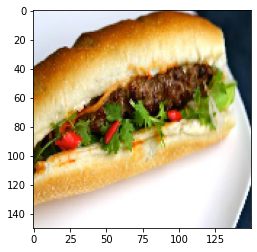

Bánh mì


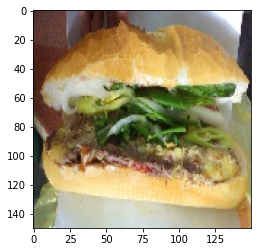

Bánh mì


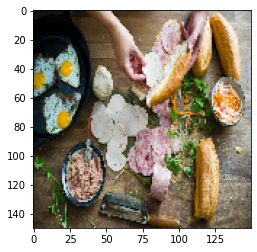

Bánh mì


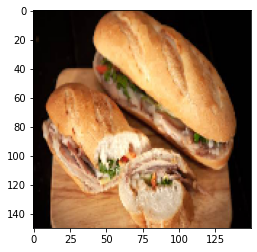

Bánh mì


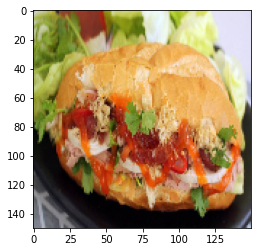

Bánh mì


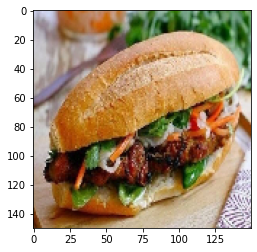

Bánh mì


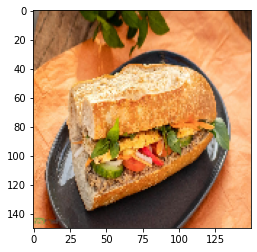

Bánh mì


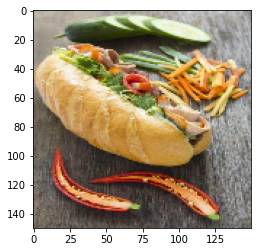

Bánh mì


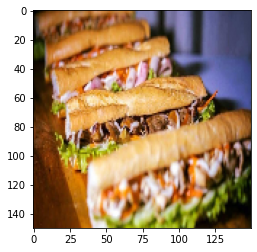

Bánh mì


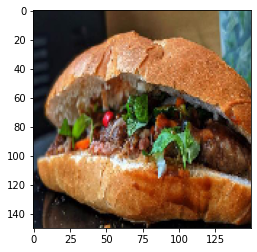

Bánh mì


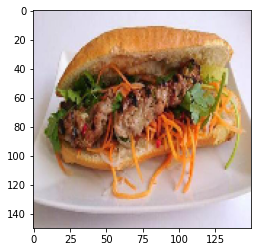

xôi


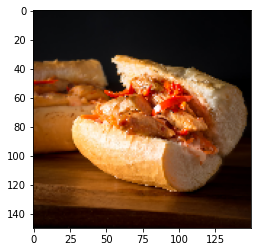

xôi


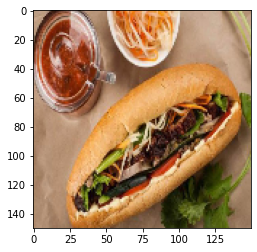

Bánh mì


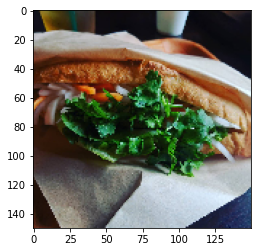

Bánh mì


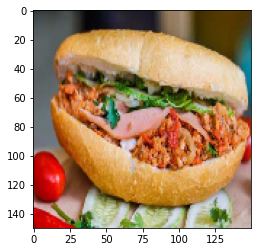

Cơm tấm


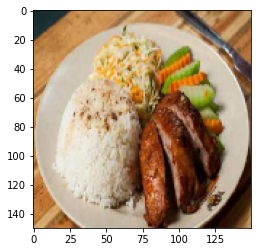

Bánh mì


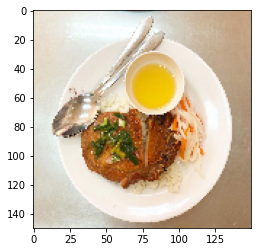

Cơm tấm


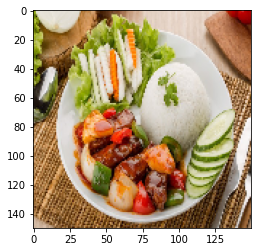

Bún đậu mắn tôm


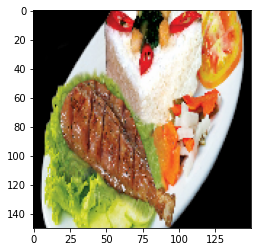

Cơm tấm


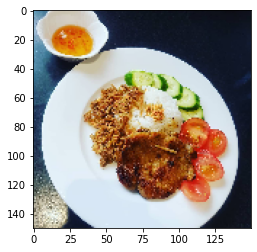

Cơm tấm


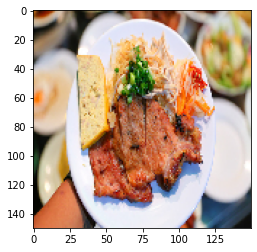

Cơm tấm


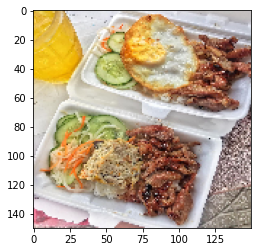

Bánh tét


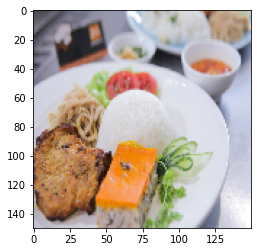

Cơm tấm


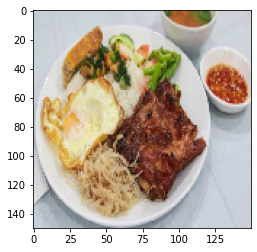

Cơm tấm


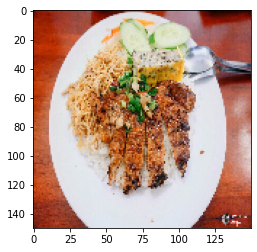

Cơm tấm


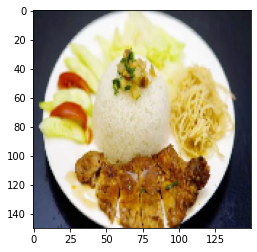

Bánh tráng nướng


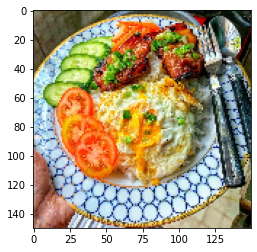

Bún đậu mắn tôm


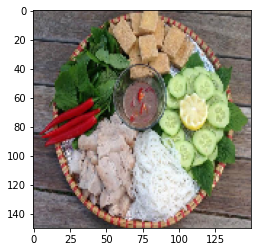

Bún đậu mắn tôm


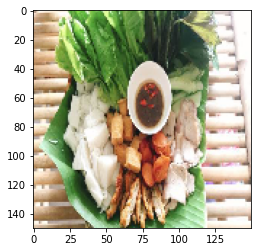

Bún đậu mắn tôm


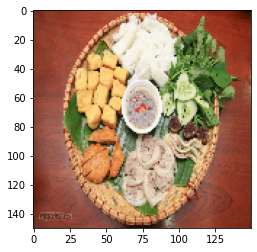

Cơm tấm


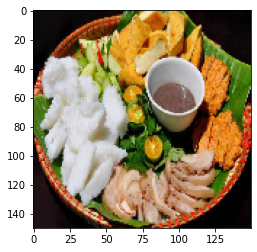

Bánh mì


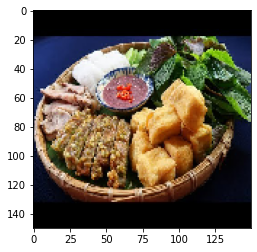

Bún đậu mắn tôm


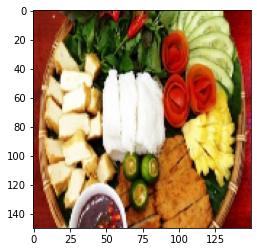

Bún đậu mắn tôm


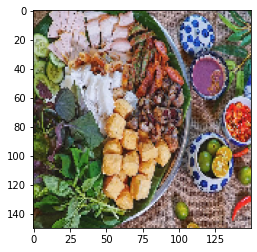

Bún đậu mắn tôm


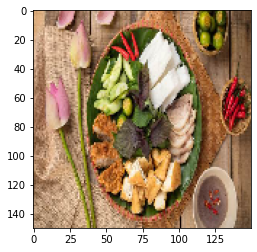

Bún bò Huế


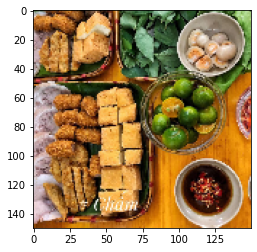

Bún bò Huế


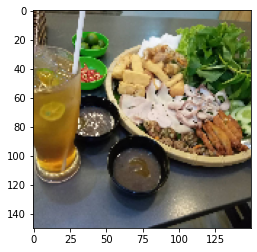

Bún đậu mắn tôm


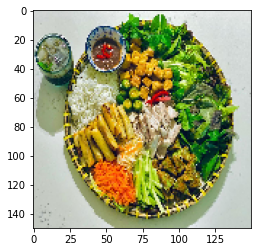

Cơm tấm


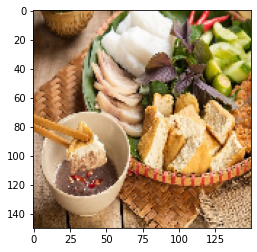

Bún bò Huế


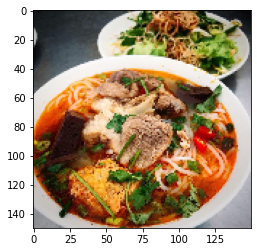

Bún bò Huế


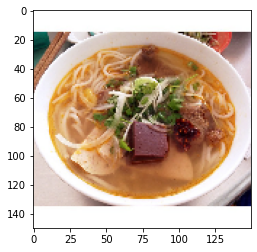

Bún bò Huế


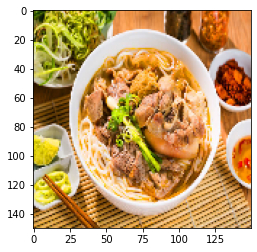

Bánh mì


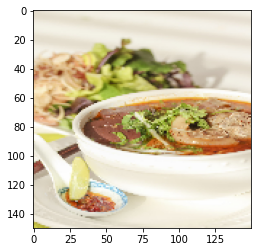

Bún bò Huế


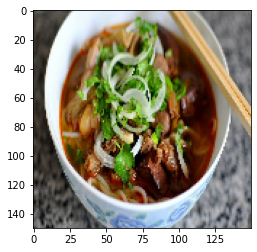

Bún bò Huế


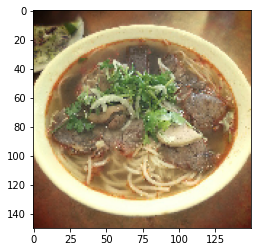

Cơm tấm


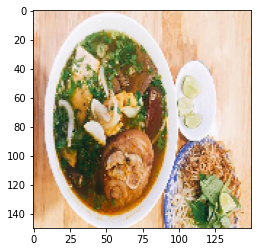

Bún bò Huế


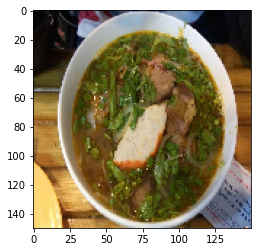

Bún bò Huế


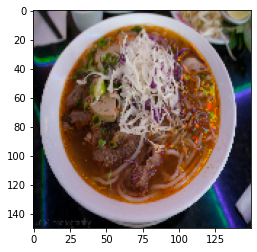

Cơm tấm


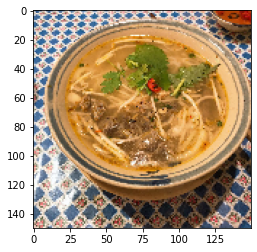

Cơm tấm


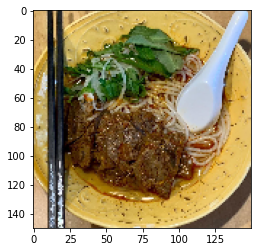

Bún bò Huế


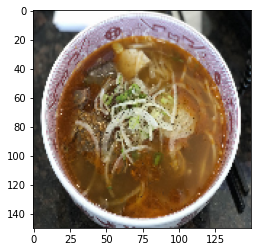

Cơm tấm


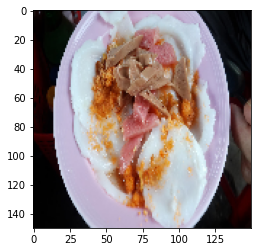

Bánh bèo


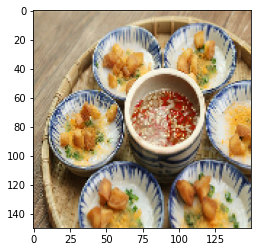

Bánh tét


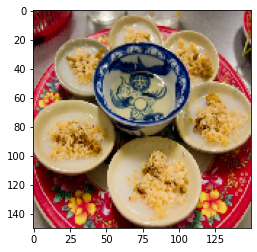

Cơm tấm


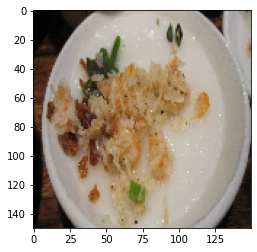

Bún đậu mắn tôm


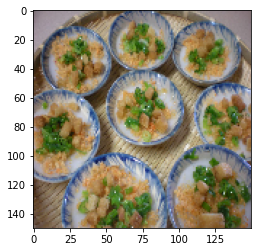

Bánh mì


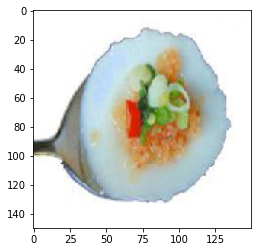

Bánh tráng nướng


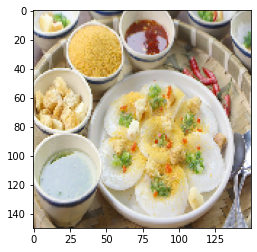

Bánh bèo


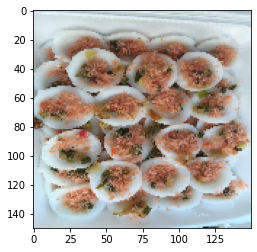

Bánh bèo


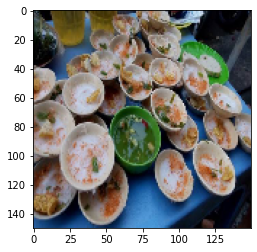

Bánh bèo


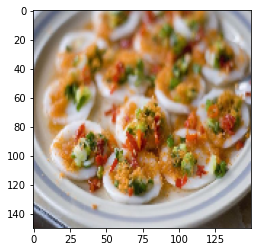

Bánh bèo


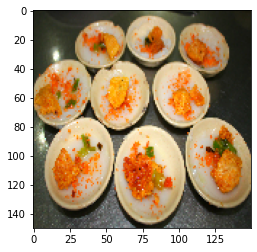

Bánh bèo


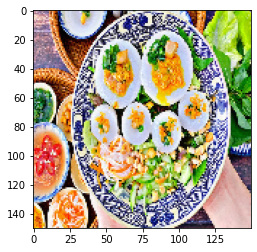

Bánh tét


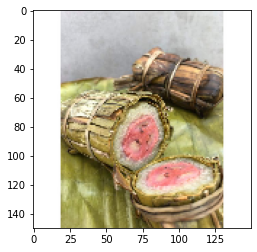

Bánh tráng nướng


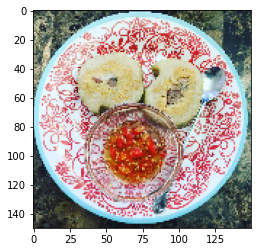

Bánh tét


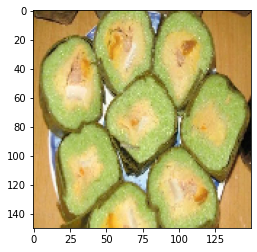

Bánh tét


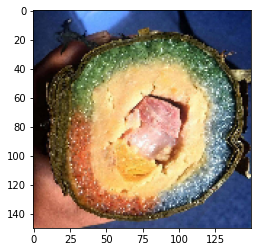

Bánh tét


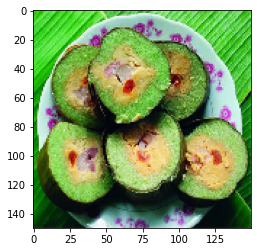

Bún đậu mắn tôm


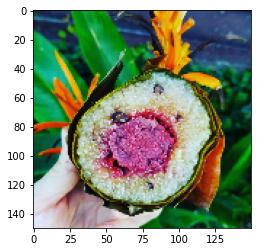

Bánh tét


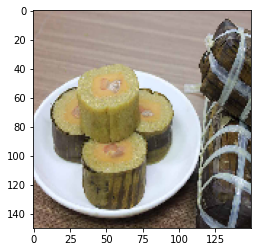

Bánh tét


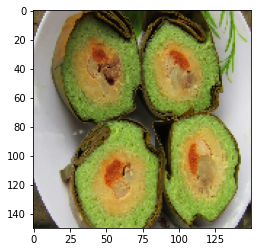

Bánh tráng nướng


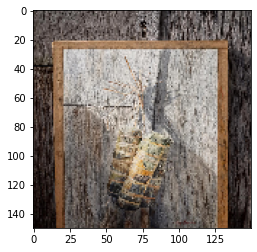

Bánh tét


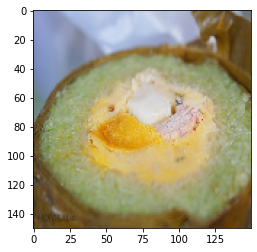

Bánh tét


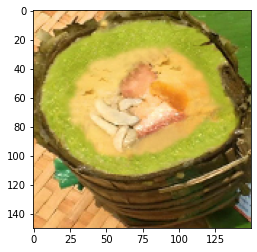

Bánh chưng


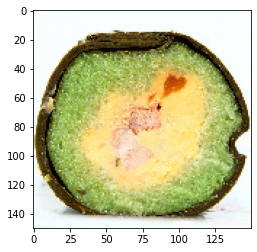

In [17]:
test="/content/drive/MyDrive/dataAI/food/Test"
for i in os.listdir(test):
  test_i = test+'/'+i
  for j in os.listdir(test_i):
    link = test_i+'/'+j
    img=load_img(link,target_size=(150,150))
    plt.imshow(img)
    img=img_to_array(img)
    img=img.astype('float32')
    img=img/255
    img=np.expand_dims(img,axis=0)
    result=model_CNN.predict(img)
    if round(result[0][0])==1:
      prediction='Bánh bèo'
    if round(result[0][1])==1:
      prediction='Bánh chưng'
    if round(result[0][2])==1:
      prediction='Bánh mì'
    if round(result[0][3])==1:
      prediction='Bánh tét'
    if round(result[0][4])==1:
      prediction='Bánh tráng nướng'
    if round(result[0][5])==1:
      prediction='Bún bò Huế'
    if round(result[0][6])==1:
      prediction='Bún đậu mắn tôm'
    if round(result[0][7])==1:
      prediction='Cơm tấm'
    if round(result[0][8])==1:
      prediction='Phở'
    if round(result[0][9])==1:
      prediction='xôi'
    print(prediction)
    plt.show()
